In [2]:
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

In [3]:
!pwd

/home/jellyfish/Documents/GitHub/Data_Science/Regression


In [4]:
ls

 Advertising.csv
'Batch 3'/
'code- Regression'/
'Descision Tree Classification.ipynb'
 Files/
 HousingData.csv
'KNN classifier Cerelas.ipynb'
'Linear regression part 1.ipynb'
'Linear Regression Practical IMplementation.ipynb'
 linear_reg.sav
 mail/
'mini project.pdf'
'Simple_Linear Regression_HeightWeight_MasterData (1).ipynb'
 test.html
 weight-height.csv
 winequalityN.csv


In [5]:
df = pd.read_csv("winequalityN.csv")

In [6]:
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [7]:
set(df.quality)

{3, 4, 5, 6, 7, 8, 9}

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
x = df.drop(columns= ["quality","type"])

In [27]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8
1,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5
2,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1
3,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9
...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
6493,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2
6494,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
6495,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [28]:
y =df.quality

In [29]:
y

0       6
1       6
2       6
3       6
4       6
       ..
6492    5
6493    6
6494    6
6495    5
6496    6
Name: quality, Length: 6497, dtype: int64

In [30]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=42)

In [31]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
3761,6.1,0.17,0.28,2.5,0.028,22.0,98.0,0.99072,3.16,0.37,11.1
3740,7.0,0.15,0.28,14.7,0.051,29.0,149.0,0.99792,2.96,0.39,9.0
1359,6.5,0.19,0.32,1.4,0.040,31.0,132.0,0.99220,3.36,0.54,10.8
1230,7.3,0.29,0.30,13.0,0.043,46.0,238.0,0.99860,3.06,0.41,8.7
4751,7.3,0.36,0.62,7.1,0.033,48.0,185.0,0.99472,3.14,0.62,10.6
...,...,...,...,...,...,...,...,...,...,...,...
3772,6.3,0.24,0.29,13.7,0.035,53.0,134.0,0.99567,3.17,0.38,10.6
5191,6.9,0.36,0.25,2.4,0.098,5.0,16.0,0.99640,3.41,0.60,10.1
5226,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7
5390,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,13.4


In [32]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
3103,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9
1419,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8
4761,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1
4690,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0
4032,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2
...,...,...,...,...,...,...,...,...,...,...,...
4294,7.4,0.22,0.28,9.0,0.046,22.0,121.0,0.99468,3.10,0.55,10.8
3757,6.5,0.26,0.34,1.4,0.040,25.0,184.0,0.99216,3.29,0.46,10.7
5954,8.9,0.48,0.53,4.0,0.101,3.0,10.0,0.99586,3.21,0.59,12.1
4418,6.6,0.22,0.23,17.3,0.047,37.0,118.0,0.99906,3.08,0.46,8.8


In [33]:
dt_model= DecisionTreeClassifier()

In [34]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [36]:
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

[Text(0.4546918852623872, 0.9868421052631579, 'x[10] <= 10.35\ngini = 0.673\nsamples = 4547\nvalue = [24.0, 153.0, 1498.0, 1974.0, 754.0, 139.0, 5.0]'),
 Text(0.1839836066685178, 0.9605263157894737, 'x[1] <= 0.237\ngini = 0.599\nsamples = 2296\nvalue = [12.0, 95.0, 1137.0, 891.0, 141.0, 20.0, 0.0]'),
 Text(0.046685120172832835, 0.9342105263157895, 'x[10] <= 8.85\ngini = 0.611\nsamples = 598\nvalue = [3, 12, 144, 331, 91, 17, 0]'),
 Text(0.007798554896161978, 0.9078947368421053, 'x[0] <= 7.25\ngini = 0.73\nsamples = 65\nvalue = [0, 0, 22, 19, 14, 10, 0]'),
 Text(0.004636978586907122, 0.881578947368421, 'x[8] <= 3.095\ngini = 0.547\nsamples = 36\nvalue = [0, 0, 17, 18, 0, 1, 0]'),
 Text(0.0025292610474038847, 0.8552631578947368, 'x[3] <= 12.2\ngini = 0.292\nsamples = 12\nvalue = [0, 0, 1, 10, 0, 1, 0]'),
 Text(0.0016861740316025898, 0.8289473684210527, 'x[1] <= 0.2\ngini = 0.625\nsamples = 4\nvalue = [0, 0, 1, 2, 0, 1, 0]'),
 Text(0.0008430870158012949, 0.8026315789473685, 'gini = 0.0\ns

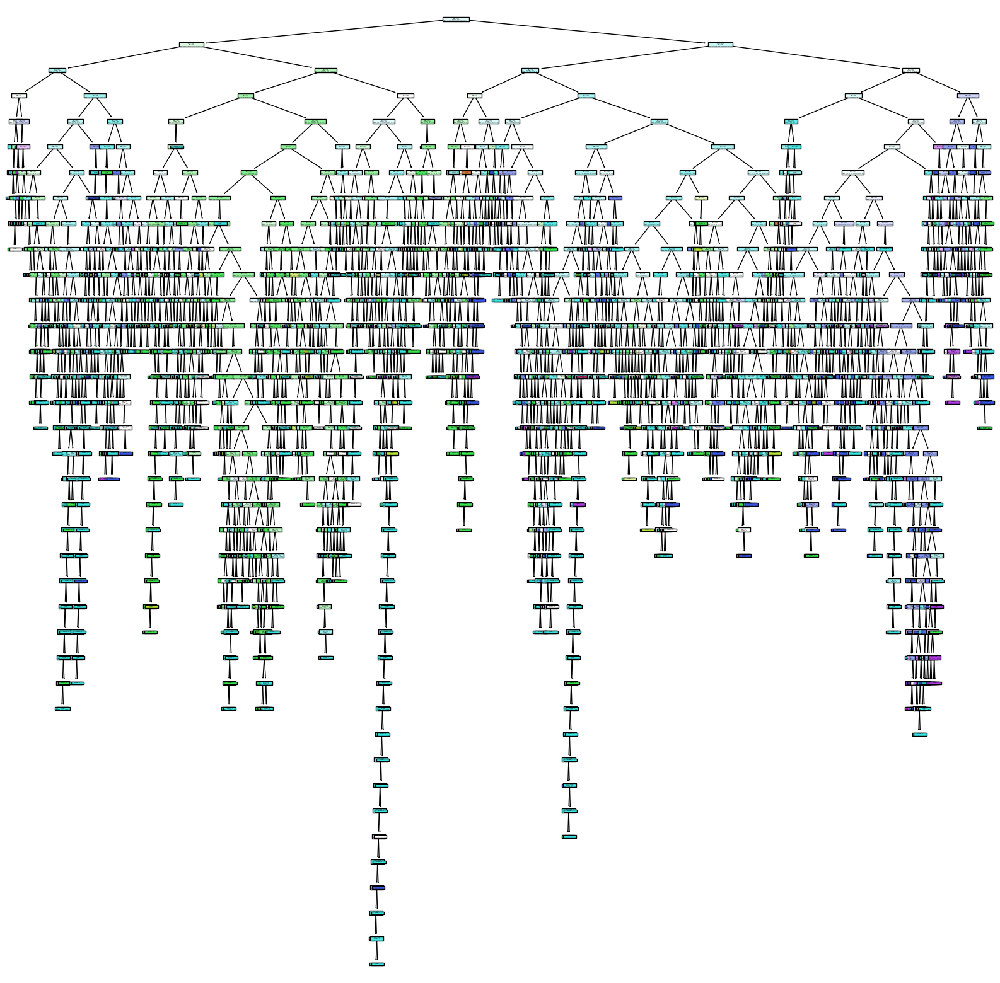

In [40]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

# Now Taking only Few data for better understanding 

In [41]:
df1 = df.head(20)

In [42]:
x1 = df1.drop(columns= ["quality","type"])

In [43]:
y1 = df1.quality

In [44]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

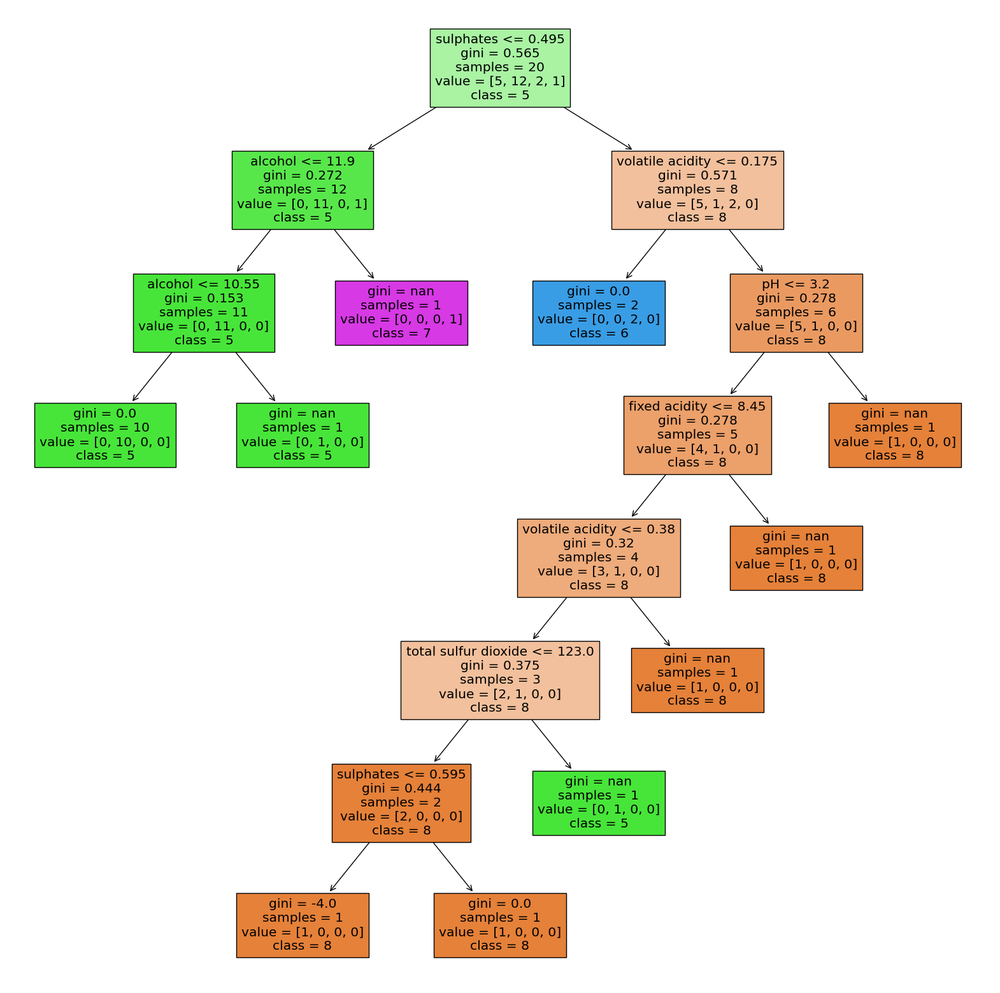

In [45]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)],feature_names=x1.columns)
plt.savefig("dt_model1")

In [46]:
dt_model.predict(x_test)

array([7, 7, 7, ..., 7, 6, 6])

In [47]:
dt_model.score(x_test,y_test)

0.6015384615384616